# Breast Cancer Prediction

# **Importing Libraries**

In [ ]:
#Data Handling
import pandas as pd
import numpy as np
#Data Visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
#Model Dependencies
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import roc_curve as sk_roc_curve, auc

# **Data Uploading**

In [ ]:
df = pd.read_csv("/content/data.csv")

# **Data overview**

In [ ]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


In [ ]:
df.tail()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
564,926424,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,926682,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,926954,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,927241,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400
568,92751,B,7.76,24.54,47.92,181.0,0.05263,0.04362,0.00000,0.00000,...,9.456,30.37,59.16,268.6,0.08996,0.06444,0.0000,0.0000,0.2871,0.07039


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df.isnull().sum()

,0
id,0
diagnosis,0
radius_mean,0
texture_mean,0
perimeter_mean,0
area_mean,0
smoothness_mean,0
compactness_mean,0
concavity_mean,0
concave points_mean,0


In [ ]:
df.drop("id", axis=1, inplace=True)

In [ ]:
print (f"Data Contains {df.shape[0]} Row")
print (f"Data Contains {df.shape[1]} Column")

Data Contains 569 Row
Data Contains 31 Column


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
radius_mean,569.0,14.127292,3.524049,6.981000,11.700000,13.370000,15.780000,28.11000
texture_mean,569.0,19.289649,4.301036,9.710000,16.170000,18.840000,21.800000,39.28000
perimeter_mean,569.0,91.969033,24.298981,43.790000,75.170000,86.240000,104.100000,188.50000
area_mean,569.0,654.889104,351.914129,143.500000,420.300000,551.100000,782.700000,2501.00000
smoothness_mean,569.0,0.096360,0.014064,0.052630,0.086370,0.095870,0.105300,0.16340
compactness_mean,569.0,0.104341,0.052813,0.019380,0.064920,0.092630,0.130400,0.34540
concavity_mean,569.0,0.088799,0.079720,0.000000,0.029560,0.061540,0.130700,0.42680
concave points_mean,569.0,0.048919,0.038803,0.000000,0.020310,0.033500,0.074000,0.20120
symmetry_mean,569.0,0.181162,0.027414,0.106000,0.161900,0.179200,0.195700,0.30400
fractal_dimension_mean,569.0,0.062798,0.007060,0.049960,0.057700,0.061540,0.066120,0.09744


# **Exploratory Data Analysis EDA**

# 1. Data Inspecting & Wrangling

In [ ]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [ ]:
print ("No. of unique values in:")
for col in df.columns.tolist():
  print(col,"is",df[col].nunique())

No. of unique values in:
diagnosis is 2
radius_mean is 456
texture_mean is 479
perimeter_mean is 522
area_mean is 539
smoothness_mean is 474
compactness_mean is 537
concavity_mean is 537
concave points_mean is 542
symmetry_mean is 432
fractal_dimension_mean is 499
radius_se is 540
texture_se is 519
perimeter_se is 533
area_se is 528
smoothness_se is 547
compactness_se is 541
concavity_se is 533
concave points_se is 507
symmetry_se is 498
fractal_dimension_se is 545
radius_worst is 457
texture_worst is 511
perimeter_worst is 514
area_worst is 544
smoothness_worst is 411
compactness_worst is 529
concavity_worst is 539
concave points_worst is 492
symmetry_worst is 500
fractal_dimension_worst is 535


In [ ]:
df["diagnosis"].value_counts()

,count
diagnosis,
B,357
M,212


In [ ]:
df.groupby("diagnosis").mean()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
diagnosis,,,,,,,,,,,,,,,,,,,,,
B,12.146524,17.914762,78.075406,462.790196,0.092478,0.080085,0.046058,0.025717,0.174186,0.062867,...,13.379801,23.515070,87.005938,558.899440,0.124959,0.182673,0.166238,0.074444,0.270246,0.079442
M,17.462830,21.604906,115.365377,978.376415,0.102898,0.145188,0.160775,0.087990,0.192909,0.062680,...,21.134811,29.318208,141.370330,1422.286321,0.144845,0.374824,0.450606,0.182237,0.323468,0.091530


In [ ]:
mean_col = ['diagnosis','radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean']

In [ ]:
se_col = ['diagnosis','radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se']

In [ ]:
worst_col = ['diagnosis','radius_worst', 'texture_worst', 'perimeter_worst',
       'area_worst', 'smoothness_worst', 'compactness_worst',
       'concavity_worst','concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst']

## 2. Data Visualization


1. Taregt Column Charts

/tmp/ipython-input-1072070715.py:1: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(df["diagnosis"], palette="Set2")


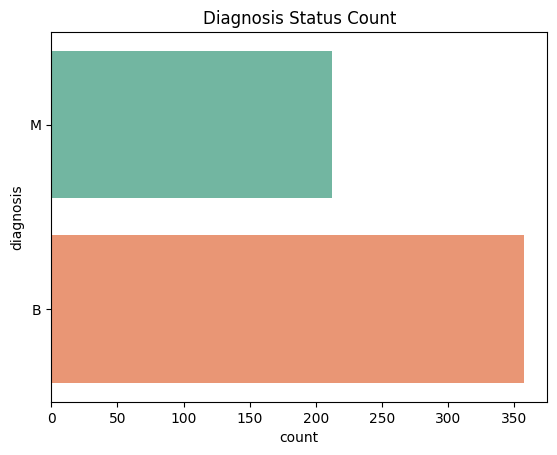

In [ ]:
sns.countplot(df["diagnosis"], palette="Set2")
plt.title("Diagnosis Status Count")
plt.show()

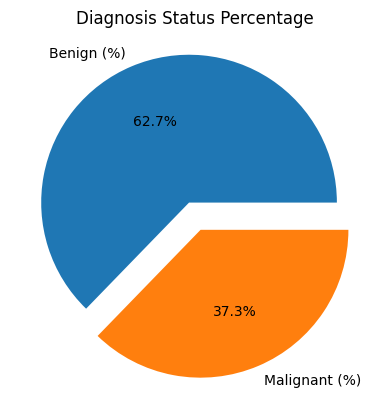

In [ ]:
plt.pie(df["diagnosis"].value_counts(), labels=['Benign (%)','Malignant (%)'],
        autopct="%1.1f%%", explode = [0.1,0.1], )
plt.title("Diagnosis Status Percentage")
plt.show()

2. Correlation Matrix

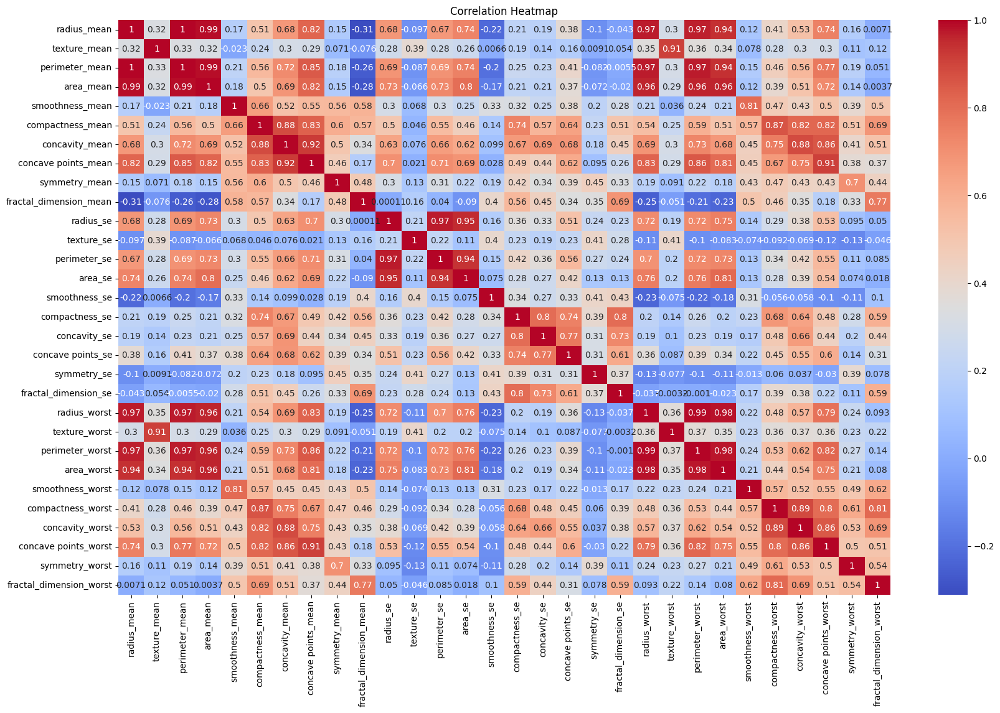

In [ ]:
df_features = df.drop(["diagnosis"], axis=1)
plt.figure(figsize=(20,12))
corr = df_features.corr()
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

3. Pair Plots

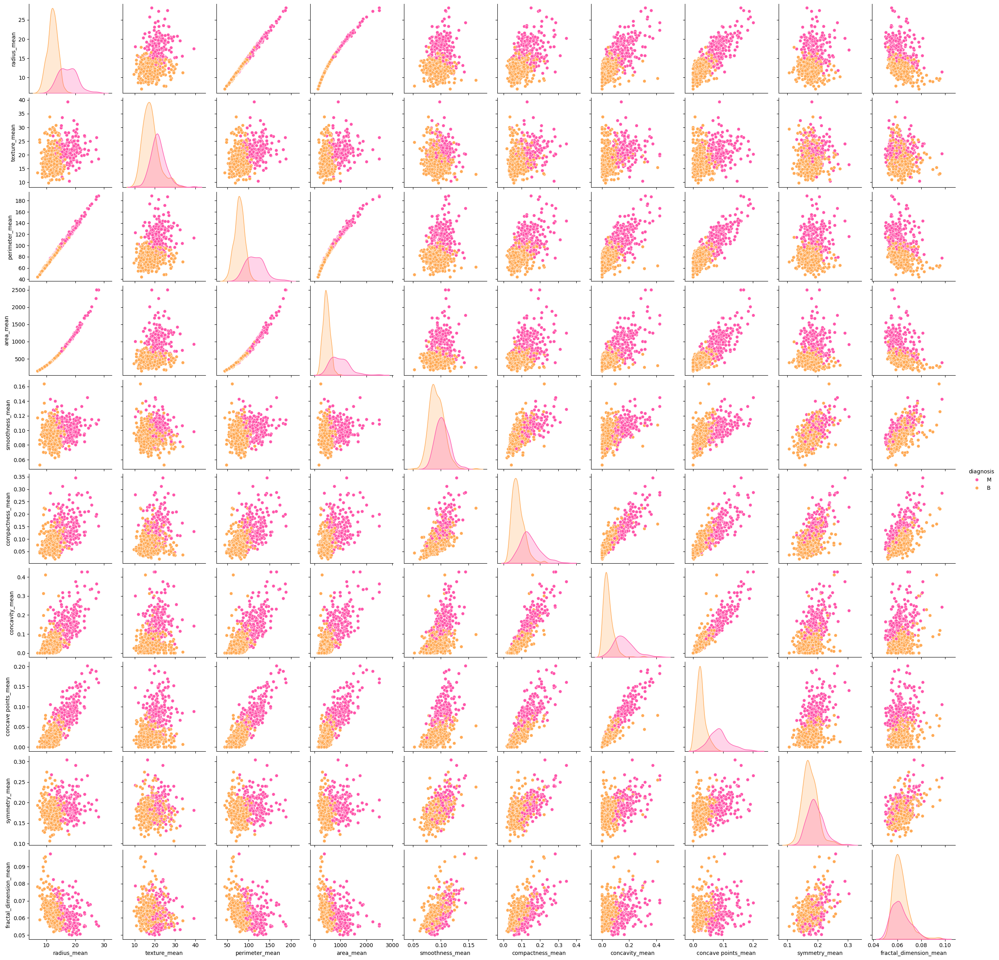

In [ ]:
sns.pairplot(df[mean_col], hue="diagnosis", palette="spring")
plt.show()

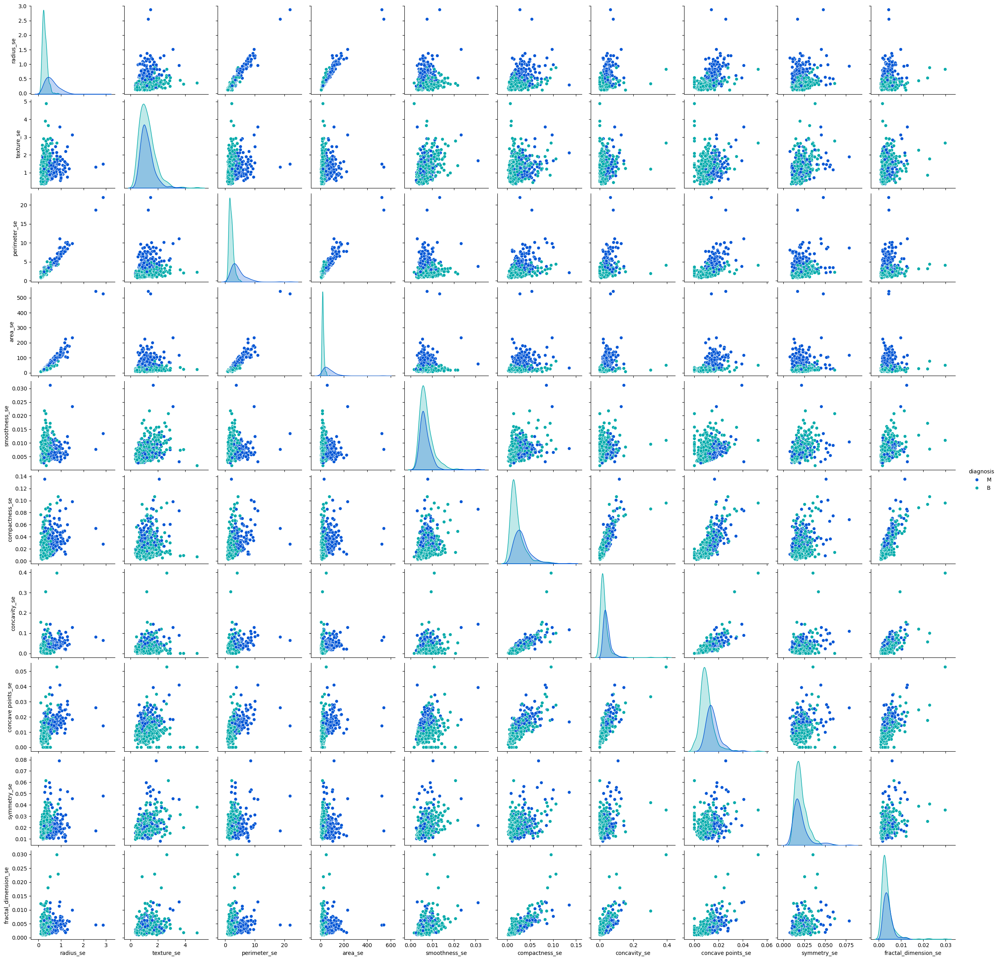

In [ ]:
sns.pairplot(df[se_col], hue="diagnosis", palette="winter")
plt.show()

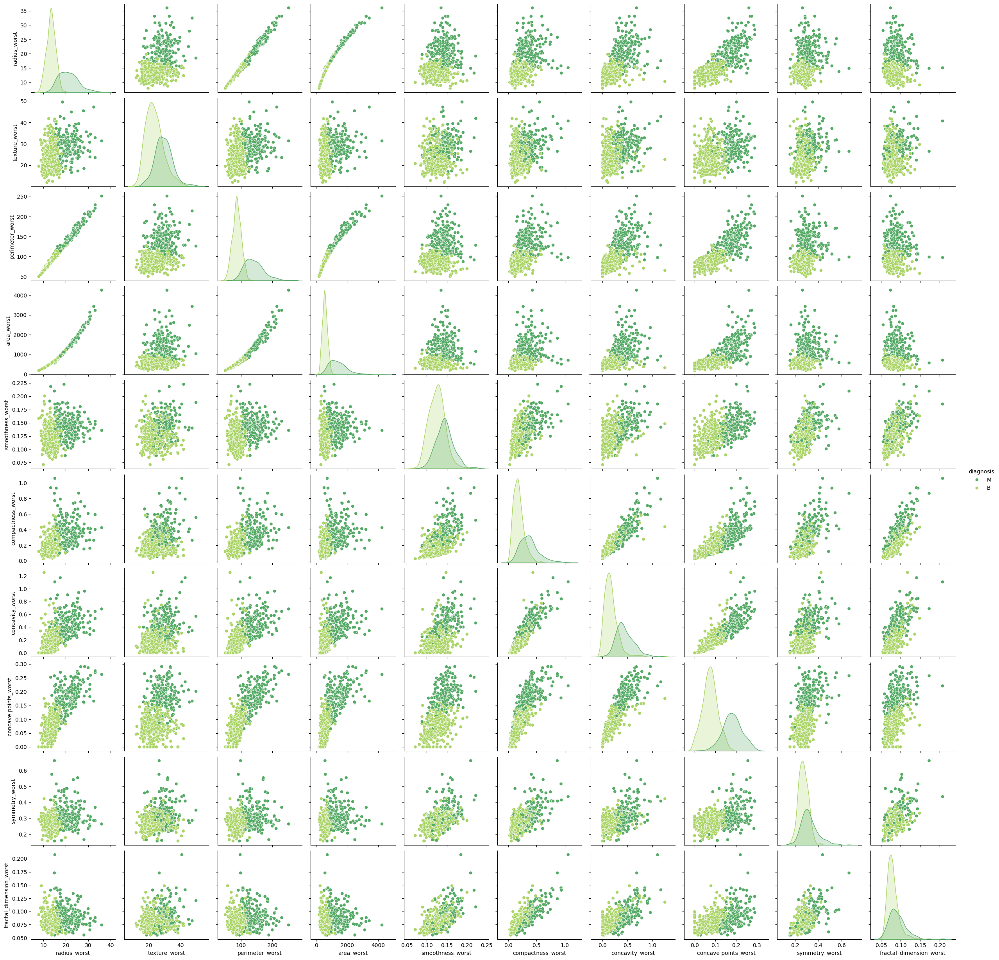

In [ ]:
sns.pairplot(df[worst_col], hue="diagnosis", palette="summer")
plt.show()


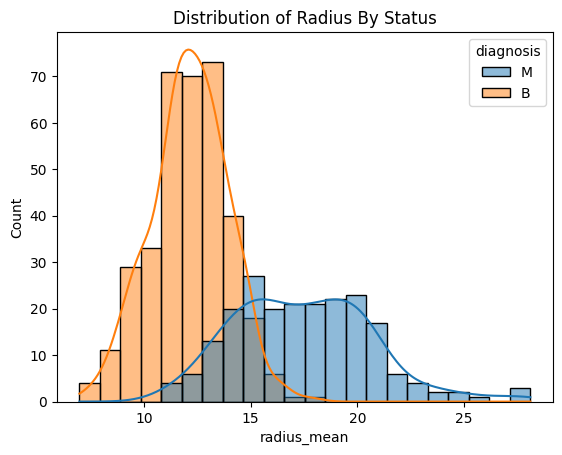

In [ ]:
sns.histplot(data= df, x="radius_mean", hue= "diagnosis", kde=True)
plt.title("Distribution of Radius By Status")
plt.show()

## 3. After Visualization

In [ ]:
df.drop(['perimeter_mean','area_mean'],axis=1,inplace=True)

In [ ]:
df.drop(['perimeter_worst','area_worst'],axis=1,inplace=True)


In [ ]:
df.drop(['perimeter_se','area_se'],axis=1,inplace=True)


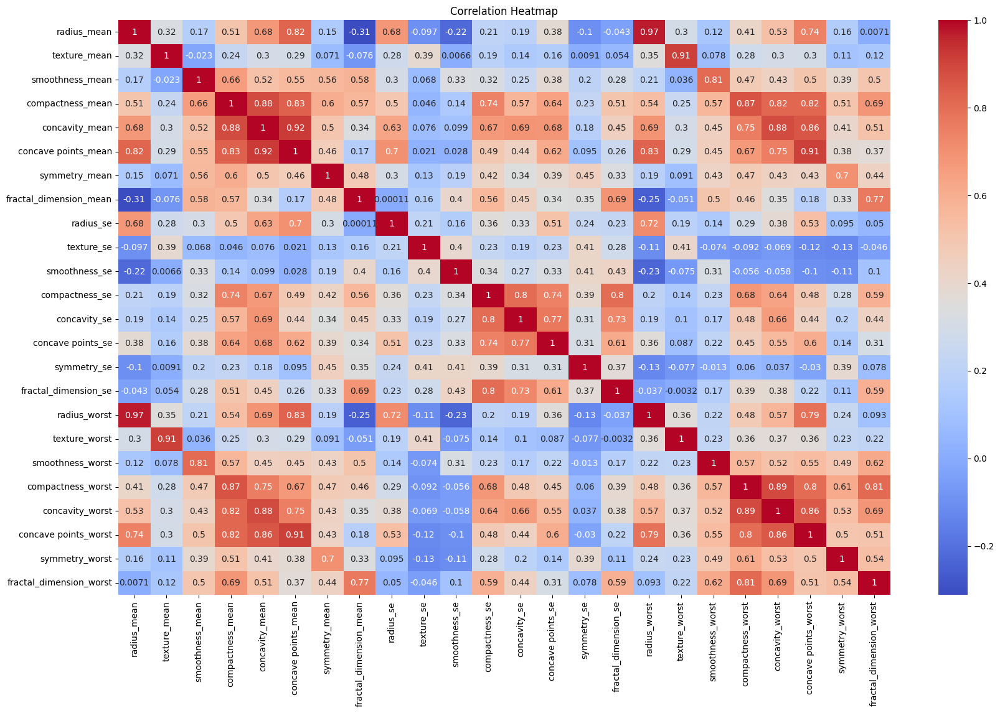

In [ ]:
df_features = df.drop(["diagnosis"], axis=1)
plt.figure(figsize=(20,12))
corr = df_features.corr()
sns.heatmap(corr, annot=True, cmap="coolwarm")
plt.title("Correlation Heatmap")
plt.show()

# **Data Preprocessing**

## - Categorical Encoding


In [ ]:
df['diagnosis']=df['diagnosis'].map({'B':0,'M':1})


## - Data Spliting

In [ ]:
X = df.drop('diagnosis',axis=1)
y = df['diagnosis']

In [ ]:
x

,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,radius_se,texture_se,...,symmetry_se,fractal_dimension_se,radius_worst,texture_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,17.99,10.38,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,1.0950,0.9053,...,0.03003,0.006193,25.380,17.33,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,0.5435,0.7339,...,0.01389,0.003532,24.990,23.41,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,0.7456,0.7869,...,0.02250,0.004571,23.570,25.53,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,0.4956,1.1560,...,0.05963,0.009208,14.910,26.50,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,0.7572,0.7813,...,0.01756,0.005115,22.540,16.67,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,21.56,22.39,0.11100,0.11590,0.24390,0.13890,0.1726,0.05623,1.1760,1.2560,...,0.01114,0.004239,25.450,26.40,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,20.13,28.25,0.09780,0.10340,0.14400,0.09791,0.1752,0.05533,0.7655,2.4630,...,0.01898,0.002498,23.690,38.25,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,16.60,28.08,0.08455,0.10230,0.09251,0.05302,0.1590,0.05648,0.4564,1.0750,...,0.01318,0.003892,18.980,34.12,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,20.60,29.33,0.11780,0.27700,0.35140,0.15200,0.2397,0.07016,0.7260,1.5950,...,0.02324,0.006185,25.740,39.42,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


In [ ]:
y

,diagnosis
0,1
1,1
2,1
3,1
4,1
...,...
564,1
565,1
566,1
567,1


In [ ]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [ ]:
y_train

,diagnosis
68,0
181,1
63,0
248,0
60,0
...,...
71,0
106,0
270,0
435,1


## *- Data Scaling*

In [ ]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [ ]:
x_train.shape

(455, 24)

In [ ]:
y_train.shape

(455,)

In [ ]:
y_test.shape

(114,)

In [ ]:
x_test.shape

(114, 24)

# **Machine Learning Models**

## 1. Model Functions

In [ ]:
# Model Base
def train_model (model, x_train, y_train):
  model.fit(x_train, y_train)
  return model

def model_predict (model, X_test):
  y_pred = model.predict(X_test)
  return y_pred

# Evalution Performance
def eval (model,x_train,y_train,y_test, y_pred):
    print(f"Training Accuracy: {model.score(x_train, y_train)}")
    print(f"Testing Accuracy: {accuracy_score(y_test, y_pred)}")
    print(f"Precision: {precision_score(y_test, y_pred)}")
    print(f"Recall: {recall_score(y_test, y_pred)}")
    print("F1 Score:", f1_score(y_test, y_pred, average='weighted'))

def conf_matrix (y_test,y_pred, title, color):
    cm = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap=color)
    plt.title(f"Confusion Matrix of {title}")
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.show()

def plot_roc_curve(model, title):
    y_prob = model.predict_proba(x_test)[:, 1]
    fpr, tpr, thresholds = sk_roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(6, 5))
    plt.plot(fpr, tpr, color='blue', lw=2,
             label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {title}')
    plt.legend(loc="lower right")
    plt.show()

 # Data Frame For Final Comparison
model_name_list = ["Logistic Regression", "SVC" ,"Naive Bayes", "K Neighbors",  "Decision Tree", "Random Forest"]
model_accuracies = []

## ***- Model 1 : Logistic Regression***


---



---



In [ ]:
log_model = LogisticRegression()

In [ ]:
train_model(log_model, x_train, y_train)

LogisticRegression()

In [ ]:
log_pred = model_predict(log_model, x_test)

In [ ]:
eval(log_model,x_train,y_train,y_test, log_pred)

Training Accuracy: 0.989010989010989
Testing Accuracy: 0.9736842105263158
Precision: 0.9545454545454546
Recall: 0.9767441860465116
F1 Score: 0.9737421322933159


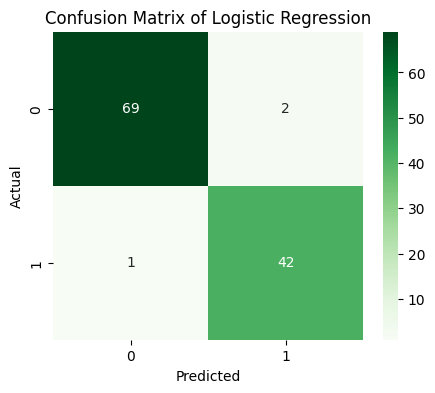

In [ ]:
conf_matrix(y_test, log_pred,"Logistic Regression", "Greens")


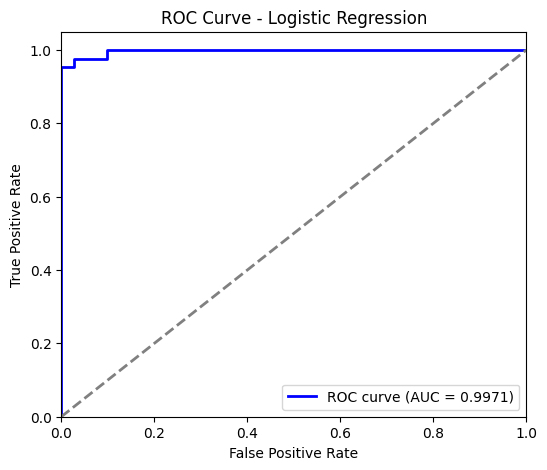

In [ ]:
plot_roc_curve(log_model, "Logistic Regression")

In [ ]:
model_accuracies.append(accuracy_score(y_test, log_pred))

## ***Model 2: Support Vector Machine SVM***

---



---



In [ ]:
svm_model = SVC(probability = True, random_state=42)

In [ ]:
train_model(svm_model, x_train, y_train)

SVC(probability=True, random_state=42)

In [ ]:
svm_pred = model_predict(svm_model, x_test)

In [ ]:
eval(svm_model,x_train,y_train,y_test, svm_pred)

Training Accuracy: 0.9868131868131869
Testing Accuracy: 0.9649122807017544
Precision: 0.9534883720930233
Recall: 0.9534883720930233
F1 Score: 0.9649122807017544


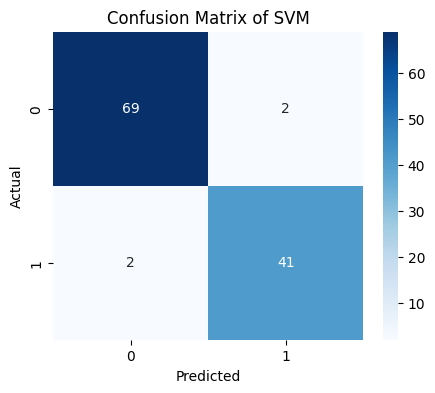

In [ ]:
conf_matrix(y_test, svm_pred,"SVM", "Blues")


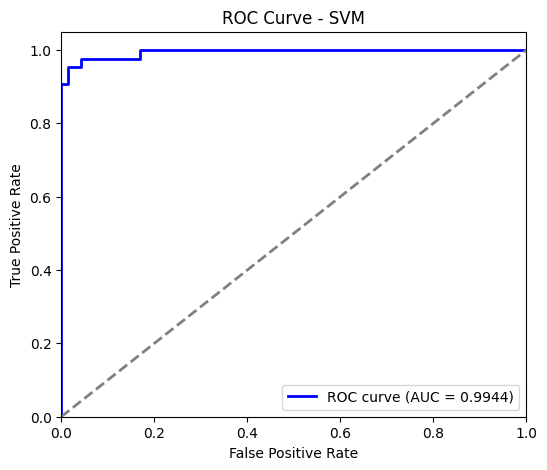

In [ ]:
plot_roc_curve(svm_model, "SVM")

In [ ]:
model_accuracies.append(accuracy_score(y_test, svm_pred))

## ***Model 3: Naive Bayes***

---



---



In [ ]:
nb_model = GaussianNB()

In [ ]:
train_model(nb_model, x_train, y_train)

GaussianNB()

In [ ]:
nb_pred = model_predict(nb_model, x_test)

In [ ]:
eval(nb_model,x_train,y_train,y_test, nb_pred)

Training Accuracy: 0.9296703296703297
Testing Accuracy: 0.956140350877193
Precision: 0.9523809523809523
Recall: 0.9302325581395349
F1 Score: 0.9560357083576898


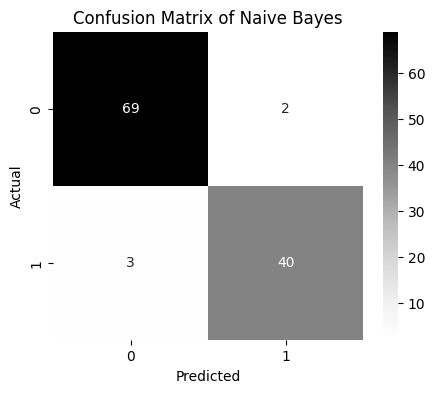

In [ ]:
conf_matrix(y_test, nb_pred,"Naive Bayes", "Grays")


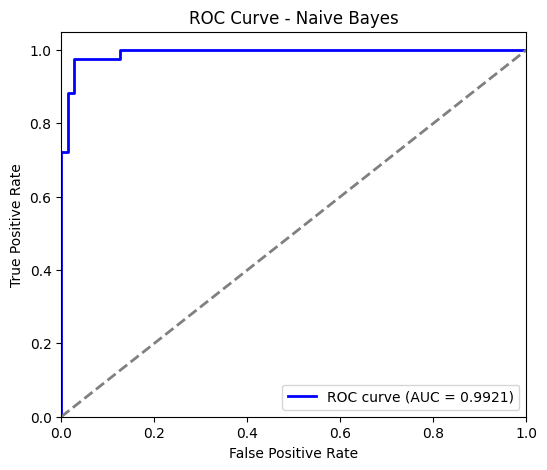

In [ ]:
plot_roc_curve(nb_model, "Naive Bayes")

In [ ]:
model_accuracies.append(accuracy_score(y_test, nb_pred))

## ***Model 4: K-Nearest Neighbors KNN***

---



---



In [ ]:
knn_model = KNeighborsClassifier()

In [ ]:
train_model(knn_model, x_train, y_train)

KNeighborsClassifier()

In [ ]:
knn_pred = model_predict(knn_model, x_test)

In [ ]:
eval(knn_model,x_train,y_train,y_test, knn_pred)

Training Accuracy: 0.9736263736263736
Testing Accuracy: 0.956140350877193
Precision: 0.9318181818181818
Recall: 0.9534883720930233
F1 Score: 0.9562368871555263


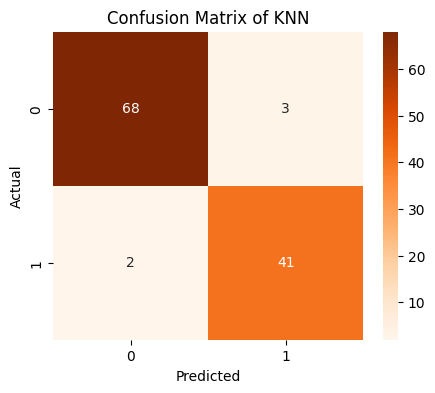

In [ ]:
conf_matrix(y_test, knn_pred,"KNN", "Oranges")


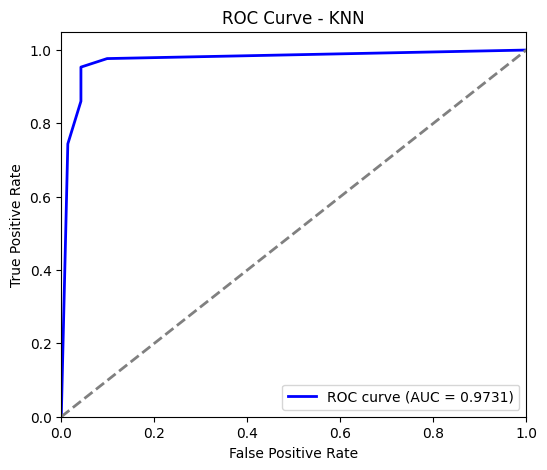

In [ ]:
plot_roc_curve(knn_model, "KNN")

In [ ]:
model_accuracies.append(accuracy_score(y_test, knn_pred))

## ***Model 5: Decision Tree***


---


---



In [ ]:
dt_model = DecisionTreeClassifier()

In [ ]:
train_model(dt_model, x_train, y_train)

DecisionTreeClassifier()

In [ ]:
dt_pred = model_predict(dt_model, x_test)

In [ ]:
eval(dt_model,x_train,y_train,y_test, dt_pred)

Training Accuracy: 1.0
Testing Accuracy: 0.9210526315789473
Precision: 0.8863636363636364
Recall: 0.9069767441860465
F1 Score: 0.9212263968799476


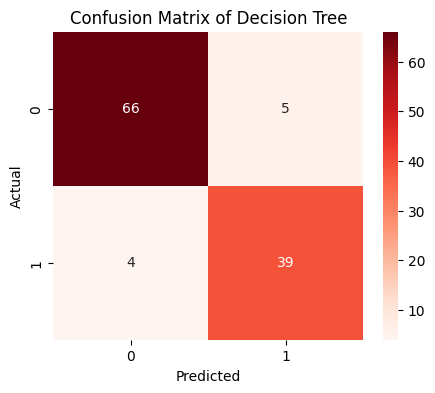

In [ ]:
conf_matrix(y_test, dt_pred,"Decision Tree", "Reds")

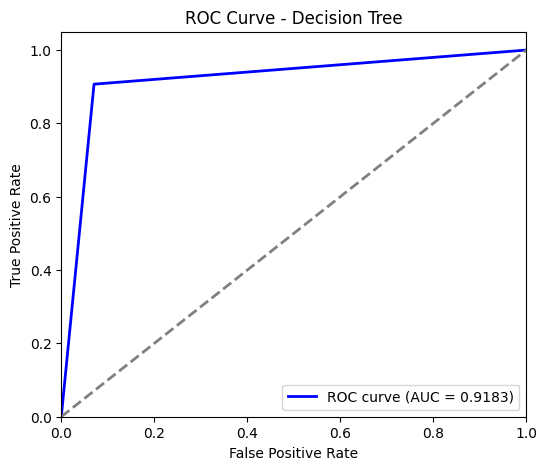

In [ ]:
plot_roc_curve(dt_model, "Decision Tree")

In [ ]:
model_accuracies.append(accuracy_score(y_test, dt_pred))

## ***Model 6: Random Forest***

---



---



In [ ]:
rf = RandomForestClassifier(n_estimators=50, random_state=42)

In [ ]:
train_model(rf, x_train, y_train)

RandomForestClassifier(n_estimators=50, random_state=1)

In [ ]:
pred_rf = model_predict(rf, x_test)

In [ ]:
eval(rf,x_train,y_train,y_test, pred_rf)

Training Accuracy: 1.0
Testing Accuracy: 0.956140350877193
Precision: 0.9523809523809523
Recall: 0.9302325581395349
F1 Score: 0.9560357083576898


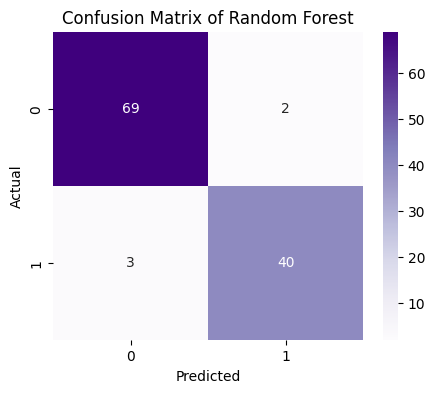

In [ ]:
conf_matrix(y_test, pred_rf,"Random Forest", "Purples")

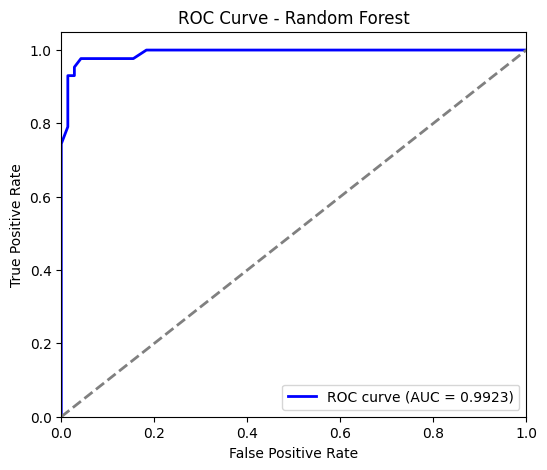

In [ ]:
plot_roc_curve(rf, "Random Forest")

In [ ]:
model_accuracies.append(accuracy_score(y_test, pred_rf))

In [ ]:
final_df = pd.DataFrame({'Model': model_name_list, 'Accuracy': model_accuracies})

In [ ]:
final_df

,Model,Accuracy
0,Logistic Regression,0.973684
1,SVC,0.964912
2,Naive Bayes,0.956140
3,K Neighbors,0.956140
4,Decision Tree,0.921053
5,Random Forest,0.956140


([0, 1, 2, 3, 4, 5],
 [Text(0, 0, 'Logistic Regression'),
  Text(1, 0, 'SVC'),
  Text(2, 0, 'Naive Bayes'),
  Text(3, 0, 'K Neighbors'),
  Text(4, 0, 'Decision Tree'),
  Text(5, 0, 'Random Forest')])

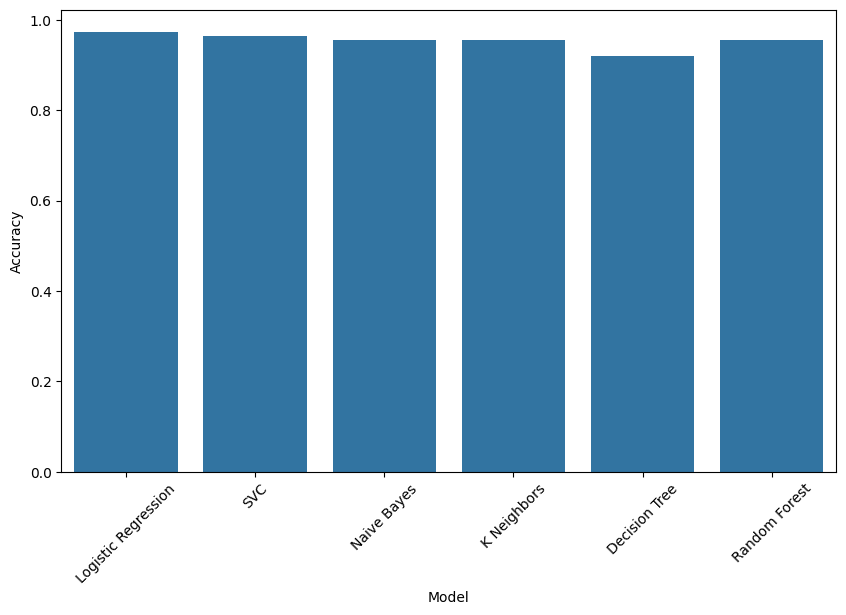

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='Model', y='Accuracy', data=final_df)
plt.xticks(rotation=45)

In [ ]:
logistic = LogisticRegression()

param_list = {"C": np.arange(0.0001, 1.01, 0.05),
             "penalty": ['l1', 'l2'],
             "solver": ['liblinear', 'lbfgs']}

model_tuning = GridSearchCV(estimator=logistic, param_grid=param_list, cv=10).fit(x_train, y_train)
y_pred_final = model_tuning.best_estimator_.predict(x_test)
accuracy_final =accuracy_score(y_test, y_pred_final)
print(f"Accuracy after tuning: {accuracy_final:.3f}")

features_importance = pd.DataFrame(model_tuning.best_estimator_.coef_.T, index=X.columns, columns=["importance_value"])
features_importance = features_importance.sort_values(by= "importance_value",ascending=False)
features_importance.head()

Accuracy after tuning: 0.974


/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py:528: FitFailedWarning: 
210 fits failed out of a total of 840.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
210 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/sklearn/model_selection/_validation.py", line 866, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.11/dist-packages/sklearn/base.py", line 1389, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py", line 1193, in fit
    solver = _check_sol

,importance_value
radius_worst,0.834504
radius_se,0.787954
radius_mean,0.707698
concave points_mean,0.647266
texture_worst,0.536930
